In [63]:
pip install scipy

In [10]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models

import numpy as np
import matplotlib.pyplot as plt


In [11]:
(x_train,y_train),(X_test,y_test)=datasets.cifar10.load_data()

170498071/170498071 [==============================] - 399s 2us/step


In [12]:
X_test.shape

(10000, 32, 32, 3)

In [14]:
x_train.shape

(50000, 32, 32, 3)

In [20]:
y_train[:5]

array([[6],
       [9],
       [9],
       [4],
       [1]], dtype=uint8)

In [21]:
y_train=y_train.reshape(-1,)
y_train[:5]

array([6, 9, 9, 4, 1], dtype=uint8)

In [25]:
y_test=y_test.reshape(-1,)
y_test[:5]

array([3, 8, 8, 0, 6], dtype=uint8)

In [26]:
classes=['airplane','autombile','bird','cat','deer','dog','frog','horse','ship','truck']

In [34]:
def plot_sample(X,y,index):
        plt.figure(figsize=(15,2))
        plt.imshow(X[index])
        plt.xlabel(classes[y[index]])

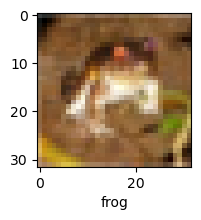

In [38]:
plot_sample(x_train,y_train,0)

In [43]:
x_train=x_train/255.0
x_test=X_test/255.0

In [56]:
ann=models.Sequential([
    layers.Flatten(input_shape=(32,32,3)),
    layers.Dense(3000,activation='relu'),
    layers.Dense(1000,activation='relu'),
    layers.Dense(10,activation='softmax')
])
ann.compile(optimizer ='SGD',
           loss='sparse_categorical_crossentropy',
           metrics=['accuracy'])
ann.fit(x_train, y_train, epochs=5)

Epoch 1/5
1563/1563 [==============================] - 133s 84ms/step - loss: 2.3027 - accuracy: 0.0984
Epoch 2/5
1563/1563 [==============================] - 157s 101ms/step - loss: 2.3027 - accuracy: 0.1000
Epoch 3/5
1563/1563 [==============================] - 143s 91ms/step - loss: 2.3027 - accuracy: 0.0964
Epoch 4/5
1563/1563 [==============================] - 142s 91ms/step - loss: 2.3027 - accuracy: 0.0977
Epoch 5/5
1563/1563 [==============================] - 139s 89ms/step - loss: 2.3027 - accuracy: 0.0991


In [65]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
import numpy as np
y_pred=ann.predict(x_test)
y_pred_classes=[np.argmax(element) for element in y_pred]

print('classification report: \n', metrics.classification_report(y_test,y_pred_classes))

313/313 [==============================] - 6s 19ms/step
classification report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      1000
           1       0.10      0.62      0.18      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.12      0.47      0.19      1000
           5       0.00      0.00      0.00      1000
           6       0.00      0.00      0.00      1000
           7       0.00      0.00      0.00      1000
           8       0.00      0.00      0.00      1000
           9       0.00      0.00      0.00      1000

    accuracy                           0.11     10000
   macro avg       0.02      0.11      0.04     10000
weighted avg       0.02      0.11      0.04     10000



C:\Users\Admin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Admin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [67]:
import seaborn as sn
plt.figure(figsize=(100,117))
sn.heatmap(y_pred,annot=True)
plt.ylabel('Truth')
plt.xlabel('Prediction')
plt.title('CM')
plt.show()

In [70]:
cnn=models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=(32,32,3)),
    layers.MaxPooling2D((2,2)),
    
    layers.Conv2D(filters=64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(10,activation='softmax')
                  
])

In [75]:
cnn.compile(optimizer='adam', 
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

In [77]:
cnn.fit(x_train,y_train,epochs=10)

Epoch 1/10
1563/1563 [==============================] - 41s 26ms/step - loss: 2.3028 - accuracy: 0.0983
Epoch 2/10
1563/1563 [==============================] - 39s 25ms/step - loss: 2.3028 - accuracy: 0.0965
Epoch 3/10
1563/1563 [==============================] - 39s 25ms/step - loss: 2.3028 - accuracy: 0.0992
Epoch 4/10
1563/1563 [==============================] - 38s 25ms/step - loss: 2.3028 - accuracy: 0.0992
Epoch 5/10
1563/1563 [==============================] - 39s 25ms/step - loss: 2.3028 - accuracy: 0.0964
Epoch 6/10
1563/1563 [==============================] - 38s 25ms/step - loss: 2.3028 - accuracy: 0.0976
Epoch 7/10
1563/1563 [==============================] - 40s 26ms/step - loss: 2.3028 - accuracy: 0.0985
Epoch 8/10
1563/1563 [==============================] - 38s 24ms/step - loss: 2.3027 - accuracy: 0.0981
Epoch 9/10
1563/1563 [==============================] - 39s 25ms/step - loss: 2.3028 - accuracy: 0.0982
Epoch 10/10
1563/1563 [==============================] - 42s 27m

In [78]:
cnn.evaluate(x_test,y_test)

313/313 [==============================] - 4s 9ms/step - loss: 2.3287 - accuracy: 0.1000


[2.328695297241211, 0.10000000149011612]

In [79]:
y_pred=cnn.predict(x_test)
y_pred[:5]

313/313 [==============================] - 4s 11ms/step


array([[0.10434645, 0.08739262, 0.10414544, 0.07873564, 0.11304494,
        0.10264011, 0.13333873, 0.09780209, 0.08650099, 0.09205294],
       [0.10112197, 0.08591144, 0.10427145, 0.07334032, 0.11763806,
        0.10018296, 0.15107359, 0.1050441 , 0.07702208, 0.08439406],
       [0.10059337, 0.08683158, 0.10401507, 0.075838  , 0.11586179,
        0.10511509, 0.14257605, 0.10468636, 0.07975245, 0.08473028],
       [0.10201443, 0.08155928, 0.1022528 , 0.06904168, 0.12192389,
        0.10594619, 0.15409544, 0.10625818, 0.07308651, 0.08382164],
       [0.10394673, 0.08514747, 0.10054974, 0.08123709, 0.11291204,
        0.10095181, 0.13337561, 0.10136414, 0.08697946, 0.09353589]],
      dtype=float32)

In [80]:
y_classes=[np.argmax(element) for element in y_pred]
y_classes[:5]

[6, 6, 6, 6, 6]

In [82]:
y_test[:5]

array([3, 8, 8, 0, 6], dtype=uint8)

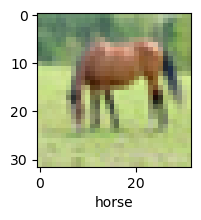

In [89]:
plot_sample(x_test,y_test,60)

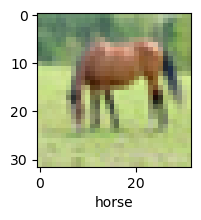

In [90]:
plot_sample(x_test,y_test,60)

In [91]:
classes[y_classes[60]]

'frog'